In [1]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
data_process.download_data()

input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



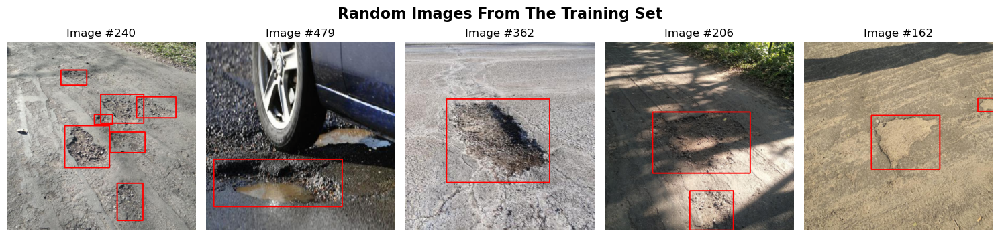

In [3]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

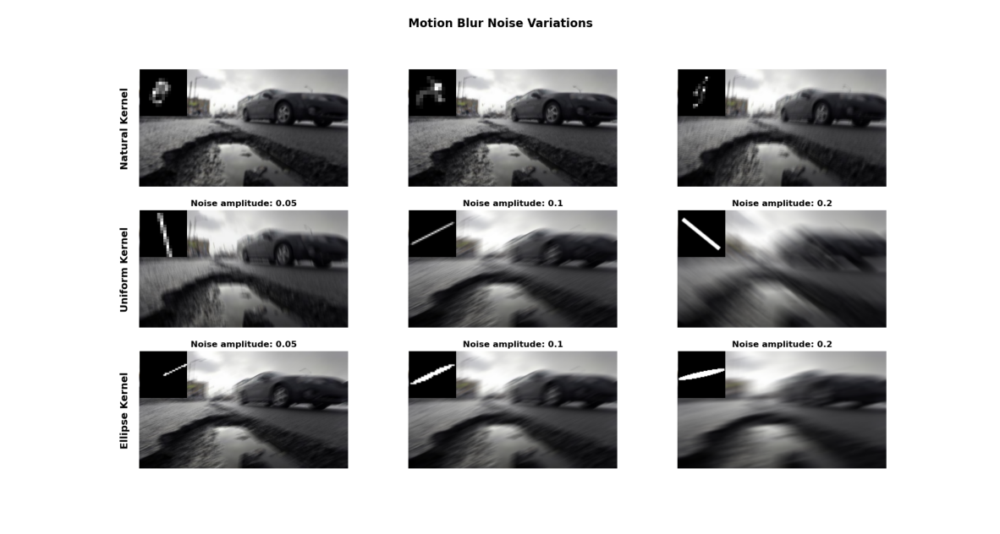

In [5]:
#show noise types
image = cv2.imread("data/motion_blur_data/motion_blur_types.png")
# Convert BGR to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)
plt.axis('off')  # Turn off axis
plt.title("", fontsize=16)
plt.show()

In [4]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/fcos_resnet50_fpn", kornia_aug=False)

Starting training for fcos_resnet50_fpn with the following parameters:
{'batch_size': 4, 'epochs': 14, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00017706784246894727, 'beta1': 0.9634396789345582, 'beta2': 0.9177747811929413, 'scheduler': 'OneCycleLR', 'max_lr': 0.0018099558447350662}
Epoch 1/14, Train Loss: 166.3938, Val mAP@50: 0.2850, FPS: 57.14, Epoch Time: 20.81 seconds
Epoch 2/14, Train Loss: 137.8534, Val mAP@50: 0.5135, FPS: 57.91, Epoch Time: 20.52 seconds
Epoch 3/14, Train Loss: 125.3448, Val mAP@50: 0.5277, FPS: 58.22, Epoch Time: 20.47 seconds
Epoch 4/14, Train Loss: 115.2970, Val mAP@50: 0.6083, FPS: 58.27, Epoch Time: 20.49 seconds
Epoch 5/14, Train Loss: 107.3018, Val mAP@50: 0.5639, FPS: 58.35, Epoch Time: 20.49 seconds
Epoch 6/14, Train Loss: 101.3863, Val mAP@50: 0.5264, FPS: 58.20, Epoch Time: 20.74 seconds
Epoch 7/14, Train Loss: 96.3203, Val mAP@50: 0.5725, FPS: 58.23, Epoch Time: 20.69 seconds
Epoch 8/14, Train Loss: 93.2364, Val mAP@50: 0.5091,

Mean Average Precision @ 0.5 : 0.5622 FPS: 58.42


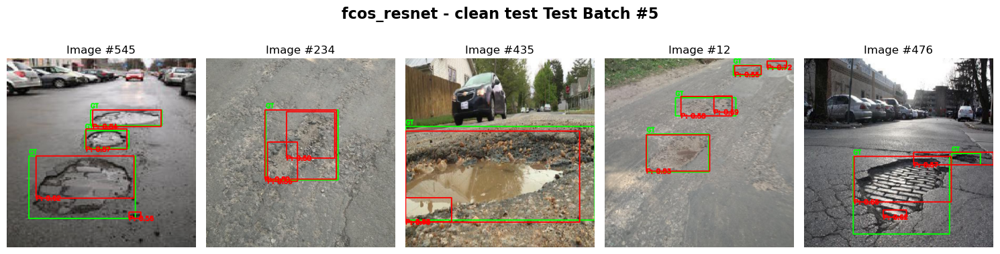

Mean Average Precision @ 0.5 : 0.4822 FPS: 58.30


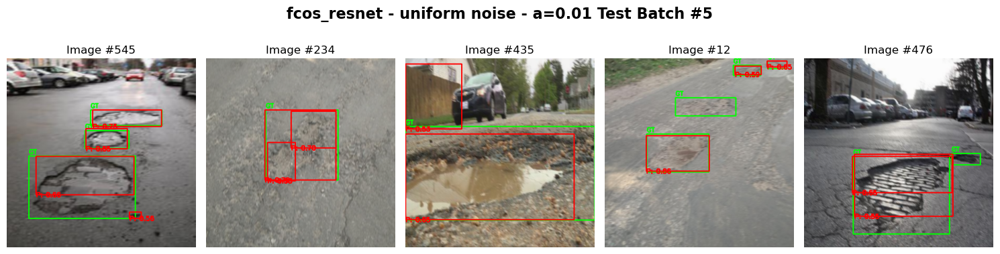

Mean Average Precision @ 0.5 : 0.0997 FPS: 58.17


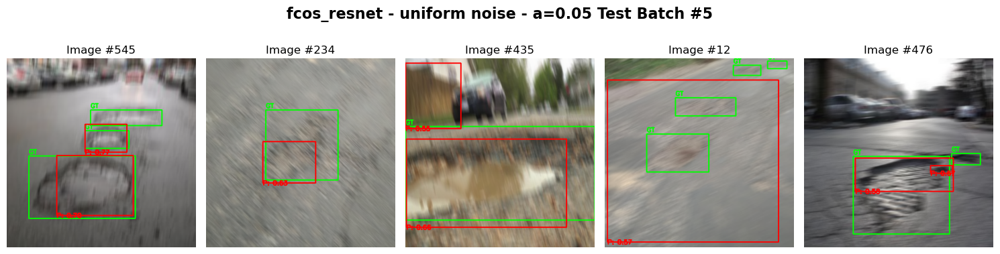

Mean Average Precision @ 0.5 : 0.0430 FPS: 58.22


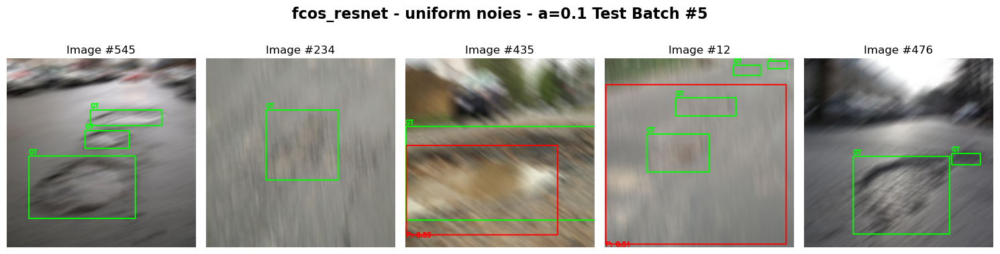

Mean Average Precision @ 0.5 : 0.4710 FPS: 58.15


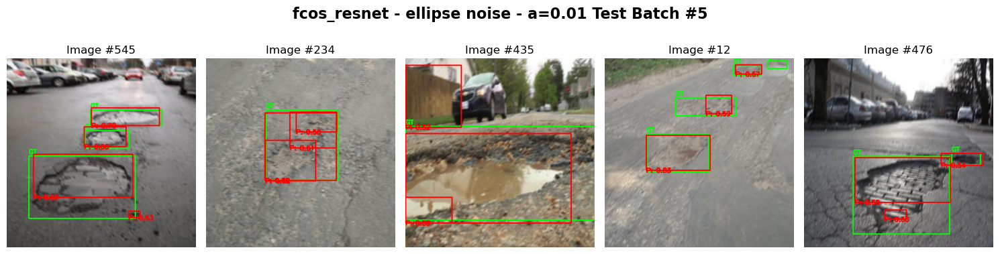

Mean Average Precision @ 0.5 : 0.1157 FPS: 58.13


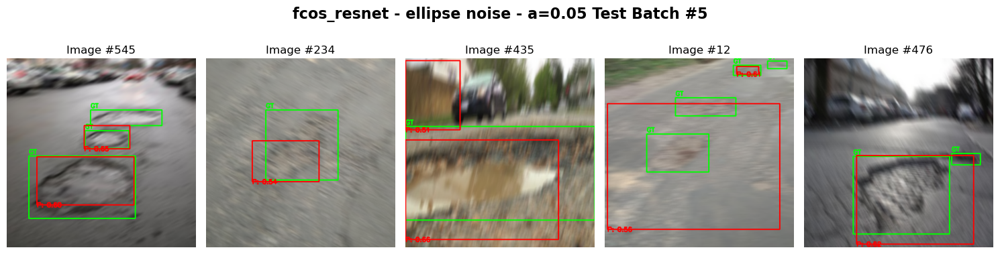

Mean Average Precision @ 0.5 : 0.0265 FPS: 58.25


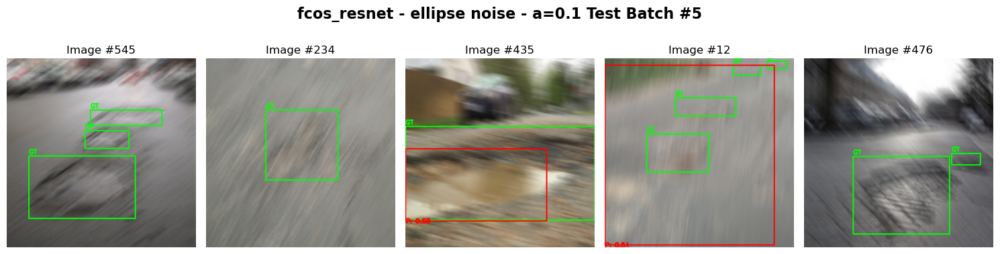

Mean Average Precision @ 0.5 : 0.3269 FPS: 58.33


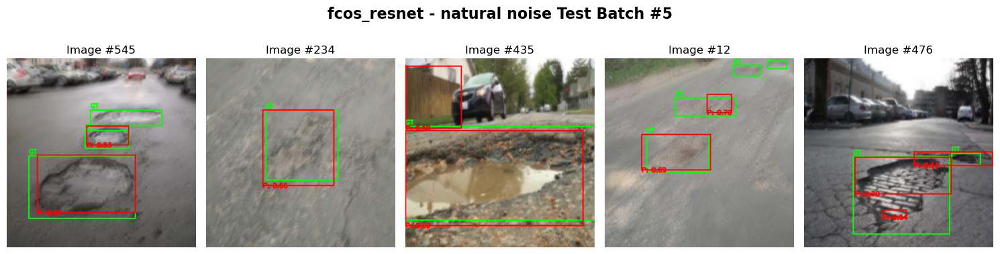

In [7]:
model_name = "fcos_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_25_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fcos_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fcos_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fcos_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fcos_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fcos_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fcos_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fcos_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fcos_resnet - natural noise")

In [8]:
# save history to .json file
utils.update_json(history, model_name="fcos_resnet")

In [9]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="./data/models/fcos_resnet50_fpn", kornia_aug=True)

Starting training for fcos_resnet50_fpn with the following parameters:
{'batch_size': 4, 'epochs': 14, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00017706784246894727, 'beta1': 0.9634396789345582, 'beta2': 0.9177747811929413, 'scheduler': 'OneCycleLR', 'max_lr': 0.0018099558447350662}


Epoch 1/14, Train Loss: 174.9369, Val mAP@50: 0.3928, FPS: 58.39, Epoch Time: 20.80 seconds
Epoch 2/14, Train Loss: 150.1762, Val mAP@50: 0.4171, FPS: 57.99, Epoch Time: 20.88 seconds
Epoch 3/14, Train Loss: 140.9608, Val mAP@50: 0.4286, FPS: 57.95, Epoch Time: 20.84 seconds
Epoch 4/14, Train Loss: 136.4323, Val mAP@50: 0.5909, FPS: 58.25, Epoch Time: 20.85 seconds
Epoch 5/14, Train Loss: 129.0115, Val mAP@50: 0.5175, FPS: 57.84, Epoch Time: 20.81 seconds
Epoch 6/14, Train Loss: 125.1651, Val mAP@50: 0.4904, FPS: 58.17, Epoch Time: 20.86 seconds
Epoch 7/14, Train Loss: 120.3206, Val mAP@50: 0.5770, FPS: 58.19, Epoch Time: 20.87 seconds
Epoch 8/14, Train Loss: 117.6981, Val mAP@50: 0.6046, FPS: 58.28, Epoch Time: 20.90 seconds
Epoch 9/14, Train Loss: 111.3381, Val mAP@50: 0.5501, FPS: 57.87, Epoch Time: 20.91 seconds
Epoch 10/14, Train Loss: 111.4797, Val mAP@50: 0.6060, FPS: 57.90, Epoch Time: 21.01 seconds
Epoch 11/14, Train Loss: 111.8378, Val mAP@50: 0.5916, FPS: 58.05, Epoch Time: 

{'train_losses': [174.93690252304077,
  150.176194190979,
  140.96076315641403,
  136.43232309818268,
  129.0114676952362,
  125.16510820388794,
  120.32055300474167,
  117.6981338262558,
  111.33807903528214,
  111.47974038124084,
  111.83780735731125,
  107.6224228143692,
  108.70736694335938,
  105.97571700811386],
 'val_maps': [0.39281994104385376,
  0.41705164313316345,
  0.42858779430389404,
  0.5908764600753784,
  0.5175207257270813,
  0.4904477596282959,
  0.577010452747345,
  0.6045944094657898,
  0.5501275658607483,
  0.6060440540313721,
  0.5916491746902466,
  0.6018632054328918,
  0.5699257254600525,
  0.5333511829376221],
 'best_val_map': 0.6060440540313721,
 'fps': 58.093365797952785,
 'train_time': 292.57094717025757,
 'model_parameters': 31842055,
 'model_size': 122.72146224975586}

Mean Average Precision @ 0.5 : 0.5454 FPS: 58.20


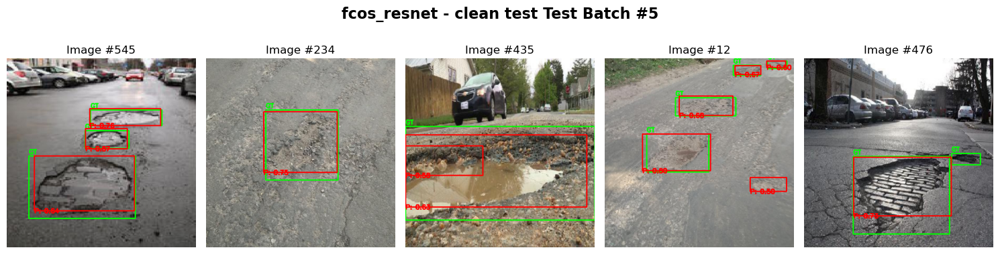

Mean Average Precision @ 0.5 : 0.4955 FPS: 58.15


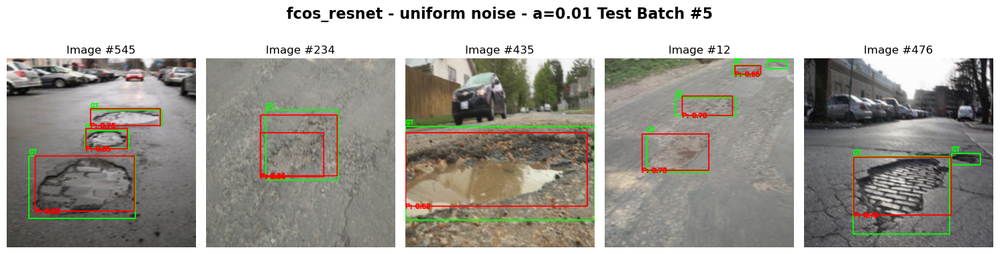

Mean Average Precision @ 0.5 : 0.4034 FPS: 57.98


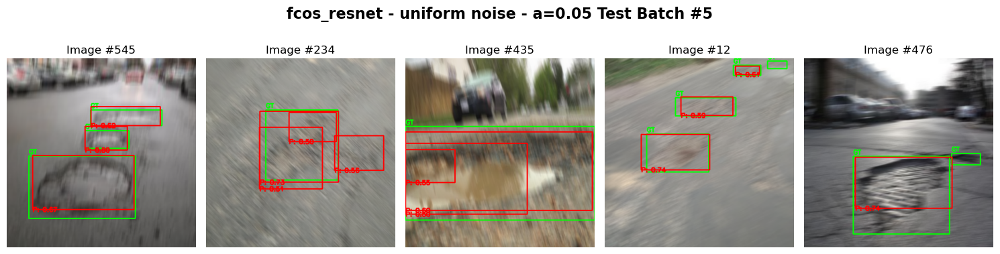

Mean Average Precision @ 0.5 : 0.3123 FPS: 58.15


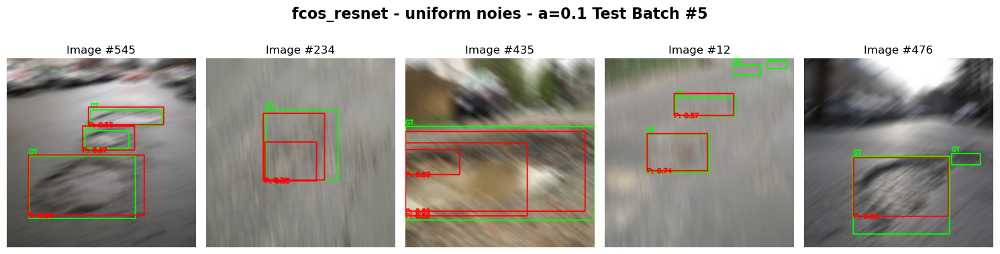

Mean Average Precision @ 0.5 : 0.4860 FPS: 58.24


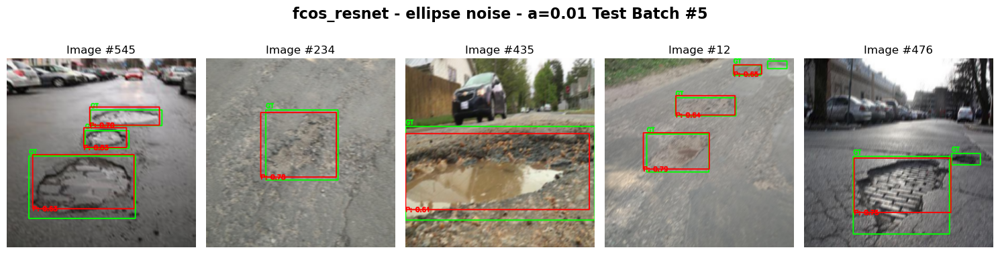

Mean Average Precision @ 0.5 : 0.3982 FPS: 58.18


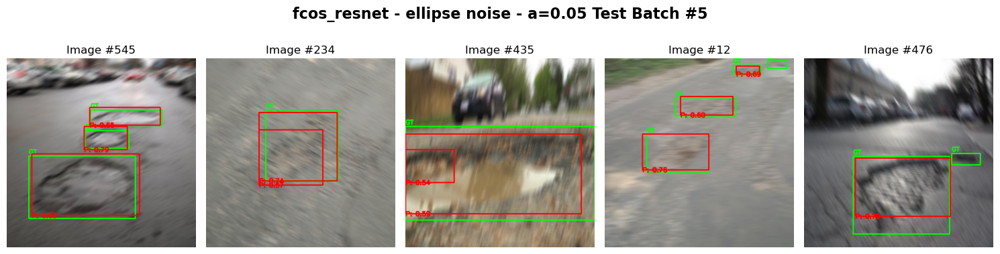

Mean Average Precision @ 0.5 : 0.2389 FPS: 58.12


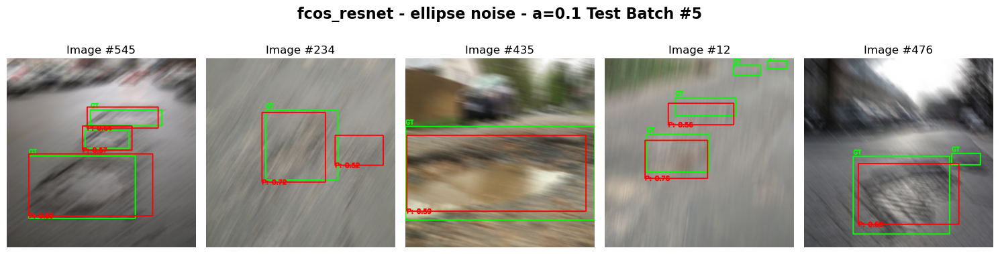

Mean Average Precision @ 0.5 : 0.3838 FPS: 58.21


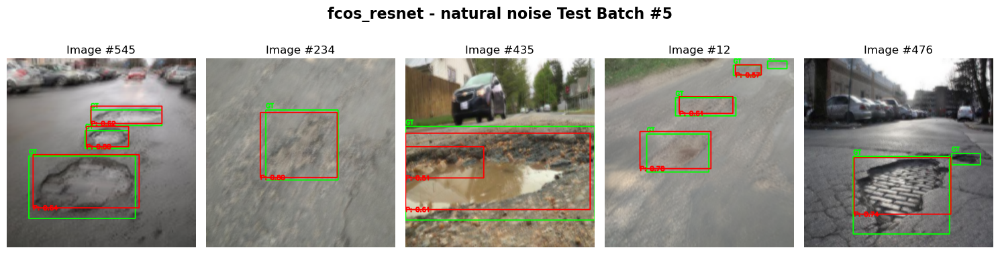

In [10]:
model_name = "fcos_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fcos_resnet50_fpn/fcos_resnet50_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fcos_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fcos_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fcos_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fcos_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fcos_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fcos_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fcos_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fcos_resnet - natural noise")

In [11]:
# save history to .json file
utils.update_json(history, model_name="fcos_resnet_aug")